# Transfer learning Resnet50
https://www.kaggle.com/datasets/kritikseth/fruit-and-vegetable-image-recognition

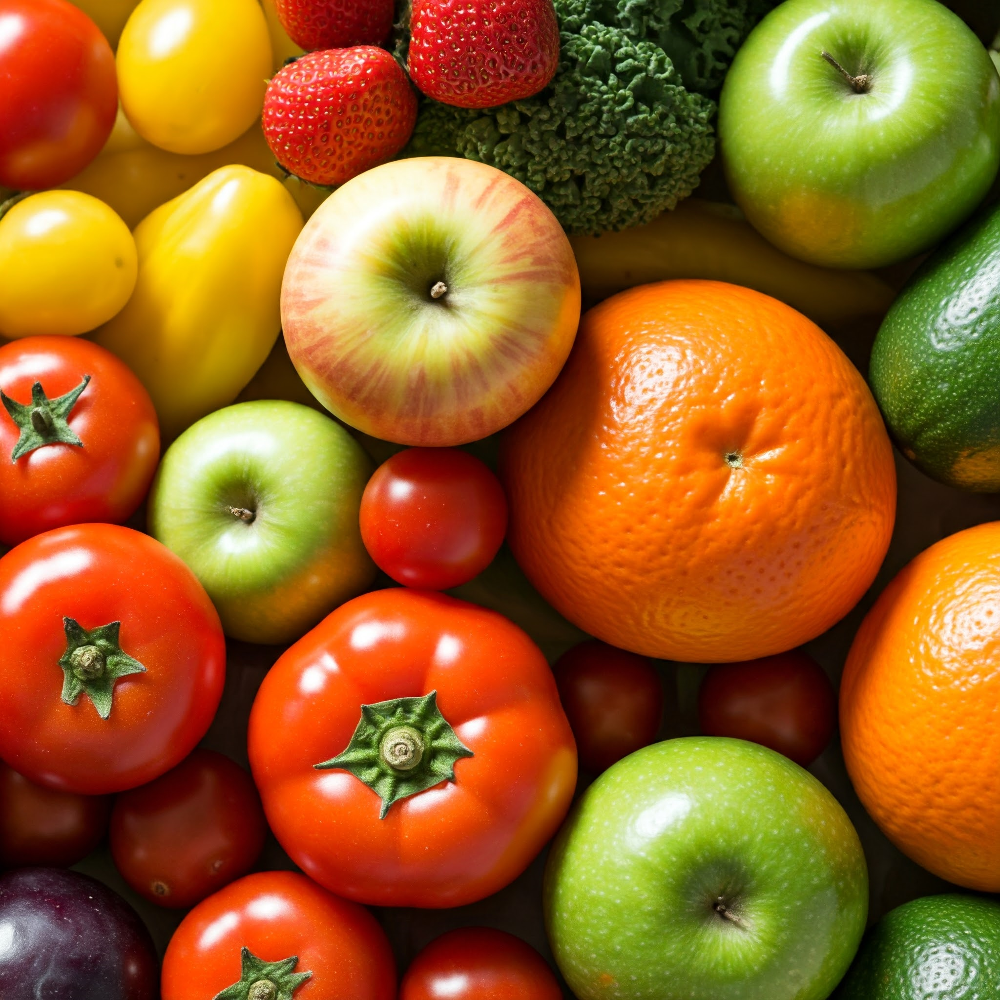

In [1]:
import numpy as np
import pandas as pd
import os

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

## 1. Gerekli Yol Ayarları

In [2]:
train_dir = '/kaggle/input/fruit-and-vegetable-image-recognition/train'
validation_dir = '/kaggle/input/fruit-and-vegetable-image-recognition/validation'
test_dir = '/kaggle/input/fruit-and-vegetable-image-recognition/test'

## 2. ImageDataGenerator ile Veriyi Hazırlama (Sadece yeniden ölçeklendirme)

In [3]:
train_datagen = ImageDataGenerator(rescale=1.0/255)
validation_datagen = ImageDataGenerator(rescale=1.0/255)
test_datagen = ImageDataGenerator(rescale=1.0/255)

## 3. Verilerin Yüklenmesi

In [4]:
batch_size = 32
img_size = (224, 224)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

Found 3115 images belonging to 36 classes.
Found 351 images belonging to 36 classes.
Found 359 images belonging to 36 classes.


## 4. Transfer Learning Modelinin Yüklenmesi (ResNet50)

In [5]:
# Önceden eğitilmiş model, ImageNet ağırlıkları ile yüklenecek.
base_model = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

## 5. Modelin Üstüne Yeni Katmanlar Eklenmesi

In [6]:
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(train_generator.num_classes, activation='softmax')  # Sınıf sayısı kadar çıktı katmanı
])

## 6. Modelin Eğitilmeye Hazırlanması

In [7]:
# Alt katmanlar donduruluyor (ResNet50 katmanları)
base_model.trainable = False

# Modeli derleme (compile)
model.compile(optimizer=Adam(learning_rate=0.1),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

## 7. Modelin Eğitilmesi

In [8]:
epochs = 10
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=epochs
)

Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1725976883.129239     430 service.cc:145] XLA service 0x7cccb8010850 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725976883.129287     430 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1725976883.129293     430 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


 2/97 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - accuracy: 0.0156 - loss: 31.0393     

I0000 00:00:1725976888.460101     430 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


97/97 ━━━━━━━━━━━━━━━━━━━━ 114s 983ms/step - accuracy: 0.0338 - loss: 12.3208 - val_accuracy: 0.0281 - val_loss: 3.5976
Epoch 2/10
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.0312 - loss: 3.6215

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


97/97 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step - accuracy: 0.0312 - loss: 3.6215 - val_accuracy: 0.0323 - val_loss: 3.5829
Epoch 3/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 86s 833ms/step - accuracy: 0.0320 - loss: 3.5957 - val_accuracy: 0.0312 - val_loss: 3.5922
Epoch 4/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0312 - loss: 3.5367 - val_accuracy: 0.0000e+00 - val_loss: 3.7224
Epoch 5/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 85s 820ms/step - accuracy: 0.0275 - loss: 3.6058 - val_accuracy: 0.0312 - val_loss: 3.6143
Epoch 6/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.0312 - loss: 3.5859 - val_accuracy: 0.0323 - val_loss: 3.6566
Epoch 7/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 84s 818ms/step - accuracy: 0.0281 - loss: 3.6091 - val_accuracy: 0.0219 - val_loss: 3.6235
Epoch 8/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.0938 - loss: 3.5261 - val_accuracy: 0.0968 - val_loss: 3.5911
Epoch 9/10
97/97 ━━━━━━━━━━━━━━━━━━━━ 90s 882ms/step - accuracy: 0.0303 - loss: 3.6116 - val_accuracy: 0.0312 - v

## 8. Model Performansının Değerlendirilmesi

In [9]:
loss, accuracy = model.evaluate(test_generator, steps=test_generator.samples // batch_size)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

11/11 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.0163 - loss: 3.5998
Test Loss: 3.6049773693084717
Test Accuracy: 0.02556818164885044


## 9. Modelin Kaydedilmesi

In [10]:
model.save("fruits_vegetables_model.h5")